In [1]:
import os
from pathlib import Path
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image
import xml.etree.ElementTree as ET
import ipyplot
from ultralytics import YOLO
import random
import shutil

In [2]:
def load_voc_data(dir, classes, split="train"):
    """
    loading the PASCAL VOC2012 data

    args:
        path: root directory of Vof OC2012
        classes: classes to load
        split: train or val

    returns:
        dataset: list of image 
        labels: class labels for each image
        boxes: bounding boxes for each image
    """
    base_dir = os.path.join(dir, "VOC2012")
    # VOC2012/ImageSets/Main, txt that includes all the info
    image_set_path = os.path.join(base_dir, "ImageSets", "Main")
    # print(image_set_path)

    # VOC2012/JPEGImages, images that contain the classes
    image_dir = os.path.join(base_dir, "JPEGImages")
    # print(image_path)

    # annotations, xml files that contain the bounding boxes
    annotation_dir = os.path.join(base_dir, "Annotations")

    # dataset = {image_id: image_path}
    dataset = {}

    # labels = {image_id: [0,0,0,0,0]}
    # array keeps track of classes present in the image
    # ["bicycle", "motorbike", "person", "cat", "train"]
    labels = {}

    # bboxes = {image_id: [[class_idx, xmin, ymin, xmax, ymax], ...]}
    bboxes = {}

    for cls_idx, cls in enumerate(classes):
        file_name = f"{cls}_{split}.txt"
        file_path = os.path.join(image_set_path, file_name)
        # print("current class...", cls)

        # open the current file
        with open(file_path, "r") as f:
            lines = f.readlines()

        for line in lines:
            image_id, label = line.strip().split()
            # print(image_id, label)
            # 0 mean difficult to tell if class is present
            # -1 not object of class in the image
            # 1 object of class in the image
            if label == "0":
                continue

            image_path = os.path.join(image_dir, f"{image_id}.jpg")
            annotation_path = os.path.join(annotation_dir, f"{image_id}.xml")
            if os.path.exists(image_path) and os.path.exists(annotation_path):
                if image_id not in dataset:
                    labels[image_id] = np.zeros(len(classes))
                    dataset[image_id] = image_path
                    bboxes[image_id] = []

                    # parse the annotation file
                    tree = ET.parse(annotation_path)
                    root = tree.getroot()
                    for obj in root.findall("object"):
                        cls_name = obj.find("name").text
                        if cls_name in classes:
                            bbox = obj.find("bndbox")
                            xmin = int(bbox.find("xmin").text)
                            ymin = int(bbox.find("ymin").text)
                            xmax = int(bbox.find("xmax").text)
                            ymax = int(bbox.find("ymax").text)

                            class_idx = classes.index(cls_name)
                            bboxes[image_id].append([class_idx, xmin, ymin, xmax, ymax])

                # 0 not present, 1 present
                labels[image_id][cls_idx] = 1 if label == "1" else 0
    dataset = list(dataset.values())
    labels = np.array(list(labels.values()))
    bboxes = list(bboxes.values())
    return dataset, labels, bboxes


file_dir = os.getcwd()

classes = ["bicycle", "motorbike", "person", "cat", "train"]

train_images, train_labels, train_bboxes = load_voc_data(file_dir, classes, "train")
val_images, val_labels, val_bboxes = load_voc_data(file_dir, classes, "val")


bboxes 0 has 1 objects
bboxes 1 has 0 objects
bboxes 2 has 0 objects
bboxes 3 has 3 objects
bboxes 4 has 0 objects
bboxes 5 has 0 objects
bboxes 6 has 3 objects
bboxes 7 has 0 objects
bboxes 8 has 7 objects
bboxes 9 has 1 objects
bboxes 10 has 0 objects
bboxes 11 has 1 objects
bboxes 12 has 0 objects
bboxes 13 has 0 objects
bboxes 14 has 0 objects
bboxes 15 has 0 objects
bboxes 16 has 0 objects
bboxes 17 has 0 objects
bboxes 18 has 0 objects
bboxes 19 has 2 objects
bboxes 20 has 0 objects
bboxes 21 has 0 objects
bboxes 22 has 0 objects
bboxes 23 has 0 objects
bboxes 24 has 2 objects
bboxes 25 has 1 objects
bboxes 26 has 2 objects
bboxes 27 has 0 objects
bboxes 28 has 2 objects
bboxes 29 has 1 objects
bboxes 30 has 2 objects
bboxes 31 has 2 objects
bboxes 32 has 2 objects
bboxes 33 has 0 objects
bboxes 34 has 0 objects
bboxes 35 has 0 objects
bboxes 36 has 0 objects
bboxes 37 has 1 objects
bboxes 38 has 1 objects
bboxes 39 has 1 objects
bboxes 40 has 0 objects
bboxes 41 has 0 objects
bb

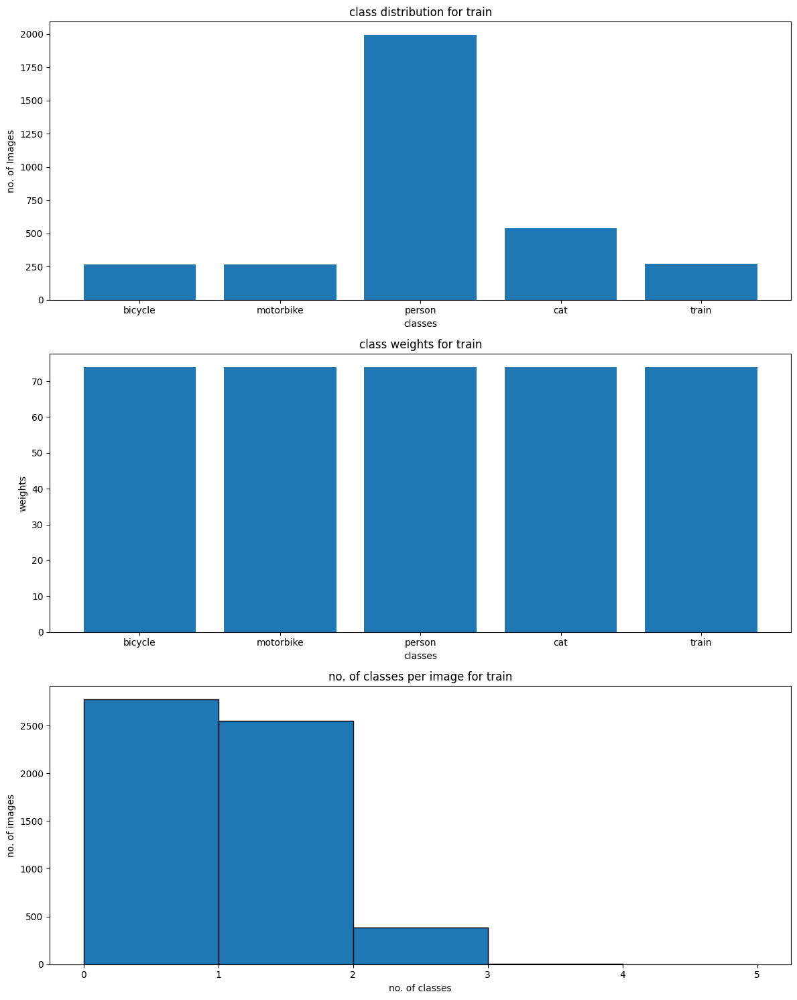

bboxes 0 has 0 objects
bboxes 1 has 2 objects
bboxes 2 has 0 objects
bboxes 3 has 0 objects
bboxes 4 has 0 objects
bboxes 5 has 0 objects
bboxes 6 has 1 objects
bboxes 7 has 0 objects
bboxes 8 has 1 objects
bboxes 9 has 3 objects
bboxes 10 has 0 objects
bboxes 11 has 0 objects
bboxes 12 has 0 objects
bboxes 13 has 2 objects
bboxes 14 has 2 objects
bboxes 15 has 0 objects
bboxes 16 has 1 objects
bboxes 17 has 1 objects
bboxes 18 has 1 objects
bboxes 19 has 0 objects
bboxes 20 has 1 objects
bboxes 21 has 0 objects
bboxes 22 has 0 objects
bboxes 23 has 0 objects
bboxes 24 has 0 objects
bboxes 25 has 0 objects
bboxes 26 has 3 objects
bboxes 27 has 0 objects
bboxes 28 has 7 objects
bboxes 29 has 0 objects
bboxes 30 has 1 objects
bboxes 31 has 1 objects
bboxes 32 has 1 objects
bboxes 33 has 0 objects
bboxes 34 has 0 objects
bboxes 35 has 1 objects
bboxes 36 has 0 objects
bboxes 37 has 5 objects
bboxes 38 has 0 objects
bboxes 39 has 0 objects
bboxes 40 has 0 objects
bboxes 41 has 0 objects
bb

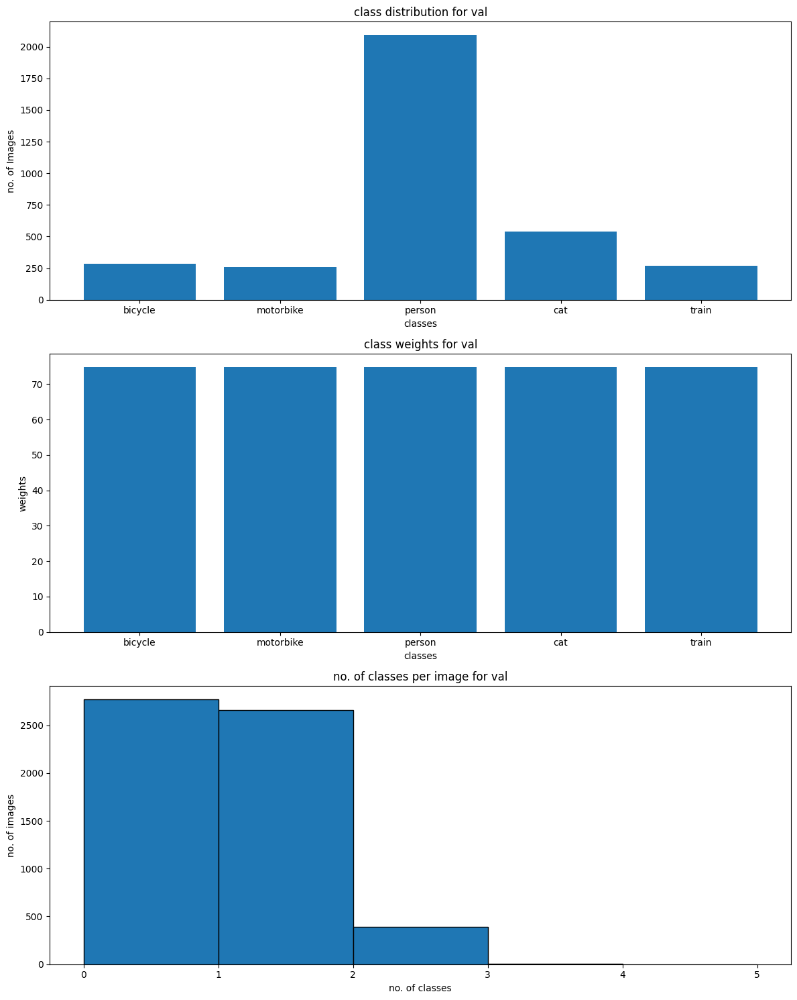

In [3]:
def calculate_class_weights(labels, classes):
    """
    creating class weights to balance the dataset
    """
    class_count = labels.sum(axis=0)
    weights = len(labels) / (len(classes) * class_count)
    weights = weights / weights.sum()
    return weights

def plot_class_distribution(labels, class_count, classes, split, weights=None):
    """
    plots the class distribution and class weights
    """

    n_plots = 3 if weights is not None else 2
    fig, axes = plt.subplots(n_plots, 1, figsize=(12, 5 * n_plots))
    axes[0].bar(classes, class_count)
    axes[0].set_title(f"class distribution for {split}")
    axes[0].set_xlabel("classes")
    axes[0].set_ylabel("no. of Images")

    if weights is not None:
        weights = class_count * weights
        axes[1].bar(classes, weights)
        axes[1].set_title(f"class weights for {split}")
        axes[1].set_xlabel("classes")
        axes[1].set_ylabel("weights")

        # multi-label classification
        labels_per_image = labels.sum(axis=1)
        axes[2].hist(labels_per_image, bins=range(len(classes) + 1), edgecolor="black")
        axes[2].set_title(f"no. of classes per image for {split}")
        axes[2].set_xlabel("no. of classes")
        axes[2].set_ylabel("no. of images")
    else:
        # multi-label classification
        labels_per_image = labels.sum(axis=1)
        axes[1].hist(labels_per_image, bins=range(len(classes) + 1), edgecolor="black")
        axes[1].set_title(f"no. of classes per image for {split}")
        axes[1].set_xlabel("no. of classes")
        axes[1].set_ylabel("no. of images")

    plt.tight_layout()
    plt.show()

def EDA(labels, bboxes, classes, split):
    """
    perform data analysis
    """
    class_count = labels.sum(axis=0)
    for i in range(len(bboxes)):
        print(f"bboxes {i} has {len(bboxes[i])} objects")
    print("class count:", class_count)
    print(f"class distribution in {split}:")
    for class_name, count in zip(classes, class_count):
        print(f"{class_name:10}: {int(count):4d} Images")

    weights = calculate_class_weights(labels, classes)
    print(f"class weights in {split}:")
    for cls, weight in zip(classes, weights):
        print(f"{cls:10}: {weight:.4f}")

    # plot the class distribution and class weights
    plot_class_distribution(labels, class_count, classes, split, weights)


EDA(train_labels, train_bboxes, classes, "train")
EDA(val_labels, val_bboxes, classes, "val")


In [4]:
def normalize_bboxes(bboxes, img_width, img_height):
    """
    normalize the bounding boxes to YOLO format
    returns:
        normalized bboxes: [class_idx, x_center, y_center, width, height]
        normalized to [0, 1]
    """
    class_idx, xmin, ymin, xmax, ymax = bboxes
            
    # Convert to YOLO format
    x_center = ((xmin + xmax) / 2) / img_width
    y_center = ((ymin + ymax) / 2) / img_height
    width = (xmax - xmin) / img_width
    height = (ymax - ymin) / img_height
    return [class_idx, x_center, y_center, width, height]

In [5]:
def normalize_data(images, bboxes, output_dir, split="train", max_per_class=200):
    """
    Normalize images and bounding boxes for YOLO
    
    Args:
        images: list of image paths
        bboxes: list of bounding boxes
    """
    output_dir = Path(output_dir)
    images_dir = output_dir / split / "images"
    labels_dir = output_dir / split / "labels"

    # clearing the directory
    if images_dir.exists():
        shutil.rmtree(images_dir)
    if labels_dir.exists():
        shutil.rmtree(labels_dir)

    images_dir.mkdir(parents=True, exist_ok=True)
    labels_dir.mkdir(parents=True, exist_ok=True)

    indices = list(range(len(images)))
    np.random.shuffle(indices)

    # grouping by class
    class_counts  = {i: 0 for i in range(5)}
    processed_images = set()
    
    # print("sample images path:", images[0])
    # print("sample bboxes:", bboxes[0])

    for idx in indices:
        img_path = images[idx]
        img_bboxes = bboxes[idx]

        classes_in_image = set(bbox[0] for bbox in img_bboxes)
        # print("classes in image:", classes_in_image)

        can_add = False
        for class_idx in classes_in_image:
            if class_counts[class_idx] < max_per_class:
                can_add = True
                break

        if can_add:
            for class_idx in classes_in_image:
                class_counts[class_idx] += 1
            processed_images.add(idx)

        if all(count >= max_per_class for count in class_counts.values()):
            break

    print("processed images:", len(processed_images))

    for idx in processed_images:
        img_path = images[idx]
        img_bboxes = bboxes[idx]

        img_name = Path(img_path).stem

        img = Image.open(img_path)
        orig_width, orig_height = img.size

        # normalize the image size to 640x640
        img = img.resize((640, 640))
        new_img_path = images_dir / f"{img_name}.jpg"
        img.save(new_img_path)
        
        # Normalize bounding boxes for this image
        label_path = labels_dir / f"{img_name}.txt"
        with open(label_path, "w") as f:
            for bbox in img_bboxes:
                norm_bbox = normalize_bboxes(bbox, orig_width, orig_height)
                class_idx, x_center, y_center, width, height = norm_bbox
                f.write(f"{class_idx} {x_center} {y_center} {width} {height}\n")
        
        print(f"processed {img_name}") 

dataset_dir = "yolo_dataset"
    
print("Normalizing training data...")   
normalize_data(train_images, train_bboxes, dataset_dir, split="train", max_per_class=200)
print("Normalizing validation data...")
normalize_data(val_images, val_bboxes, dataset_dir, split="val", max_per_class=200)

current_dir = os.getcwd()

yaml_content = f"""
path: {current_dir}
train: yolo_dataset/train/images
val: yolo_dataset/val/images

# classes
names:
    0: bicycle
    1: motorbike
    2: person
    3: cat
    4: train
"""

yaml_path = os.path.join(current_dir, "yolo_dataset.yaml")

# make if doesn't exist
os.makedirs(os.path.join(current_dir), exist_ok=True)

with open(yaml_path, "w") as f:
    f.write(yaml_content)

# Verify paths
train_path = os.path.join(current_dir, 'yolo_dataset/train/images')
val_path = os.path.join(current_dir, 'yolo_dataset/val/images')

print(f"Train path : {train_path}")
print(f"Val path : {val_path}")
print(f"YAML path: {yaml_path}")

print("dataset yaml file created")

Normalizing training data...
processed images: 949
processed 2010_002556
processed 2010_002573
processed 2008_000036
processed 2008_008572
processed 2008_000045
processed 2008_008579
processed 2008_000060
processed 2008_008590
processed 2008_008591
processed 2010_002618
processed 2008_000096
processed 2008_008618
processed 2008_000109
processed 2008_008637
processed 2008_008641
processed 2008_000143
processed 2008_000144
processed 2008_008671
processed 2008_008673
processed 2008_008681
processed 2008_008691
processed 2010_002720
processed 2008_008697
processed 2008_008701
processed 2008_000191
processed 2008_008696
processed 2008_000196
processed 2008_008725
processed 2008_008735
processed 2008_000217
processed 2008_008745
processed 2008_000227
processed 2008_000235
processed 2008_008749
processed 2010_002781
processed 2008_008757
processed 2010_002801
processed 2008_000275
processed 2010_002820
processed 2010_002821
processed 2010_002838
processed 2008_000311
processed 2010_002843
pro

Checking Training Set:
Displaying 5 images from train set:



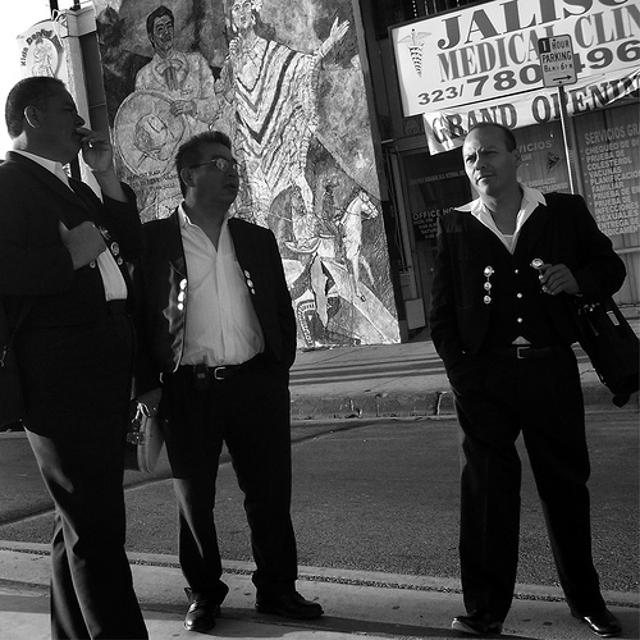
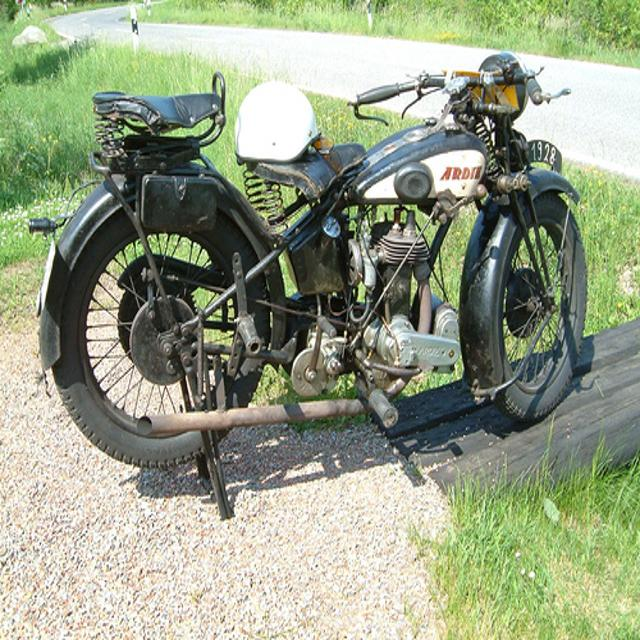
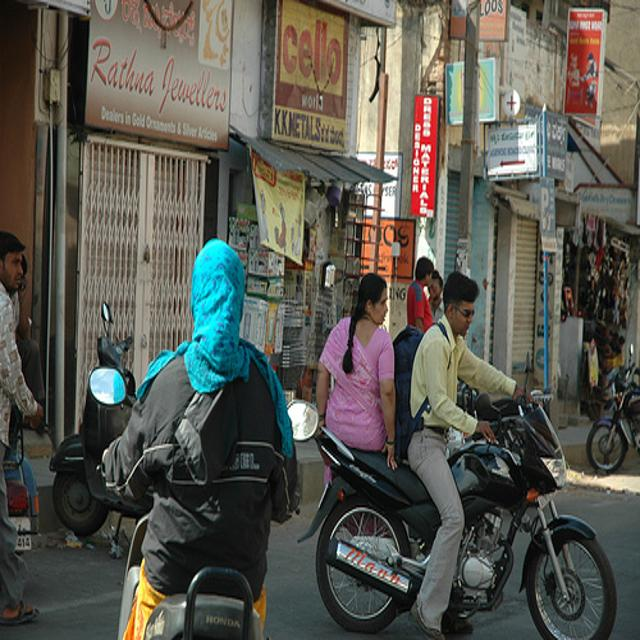
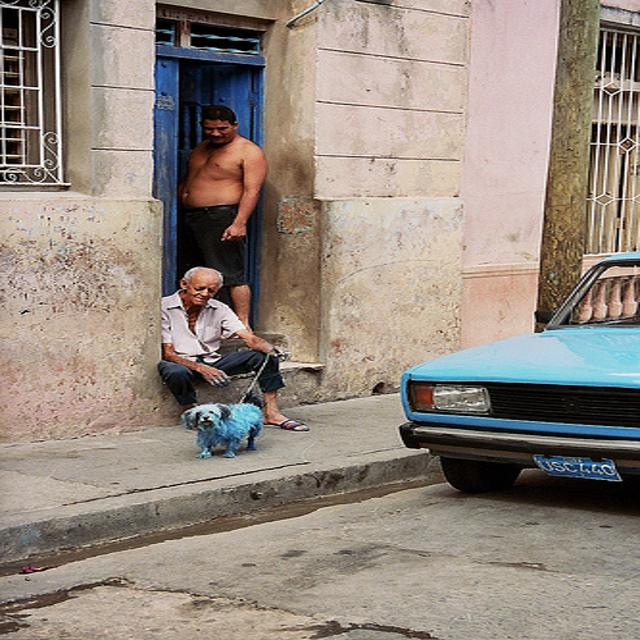
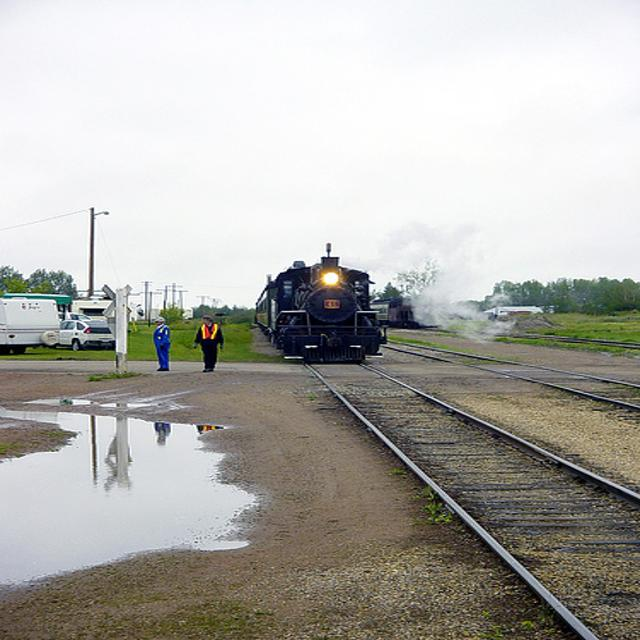


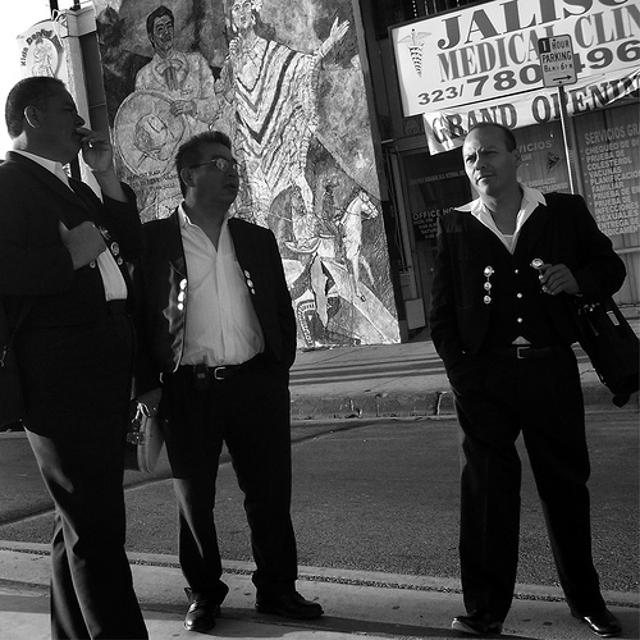
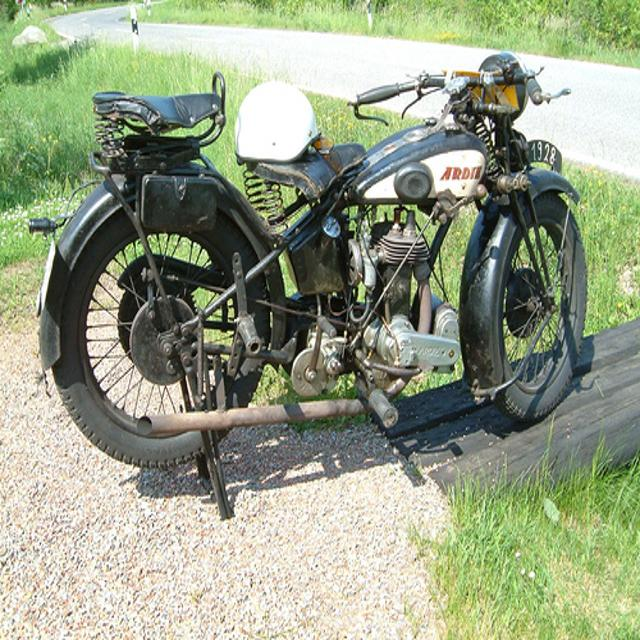
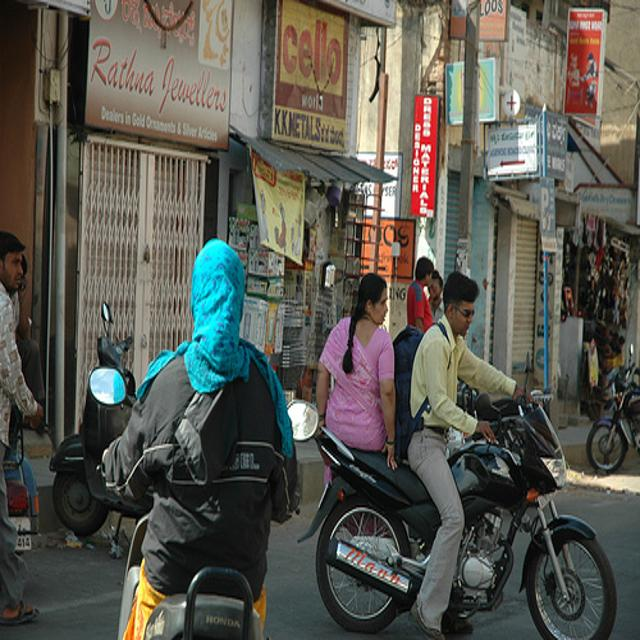
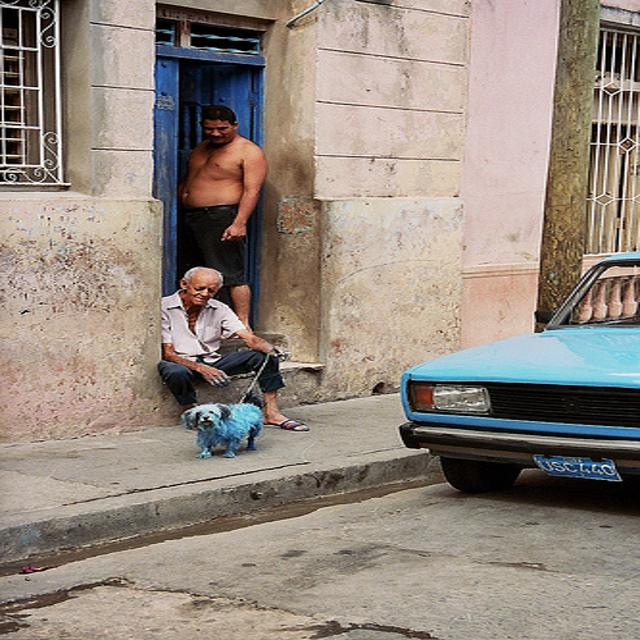
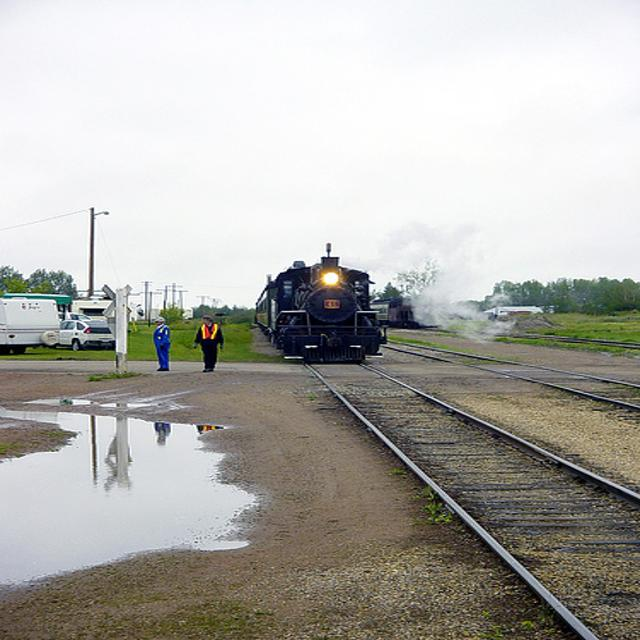


Checking Image Properties:

Image 0: 2010_003949.jpg
- Shape: (640, 640, 3)
- Value Range: [0, 255]
- Data Type: uint8

Bounding Boxes:
- Class 2: center=(0.826, 0.595), size=(0.316, 0.810)
- Coordinates in [0,1]: True
- Class 2: center=(0.119, 0.559), size=(0.234, 0.882)
- Coordinates in [0,1]: True
- Class 2: center=(0.354, 0.596), size=(0.304, 0.788)
- Coordinates in [0,1]: True

Image 1: 2011_001498.jpg
- Shape: (640, 640, 3)
- Value Range: [0, 255]
- Data Type: uint8

Bounding Boxes:
- Class 1: center=(0.481, 0.447), size=(0.874, 0.744)
- Coordinates in [0,1]: True

Image 2: 2008_004084.jpg
- Shape: (640, 640, 3)
- Value Range: [0, 255]
- Data Type: uint8

Bounding Boxes:
- Class 1: center=(0.958, 0.638), size=(0.084, 0.201)
- Coordinates in [0,1]: True
- Class 1: center=(0.159, 0.659), size=(0.162, 0.369)
- Coordinates in [0,1]: True
- Class 1: center=(0.034, 0.746), size=(0.060, 0.249)
- Coordinates in [0,1]: True
- Class 1: center=(0.319, 0.785), size=(0.362, 0.429)
- Coordina


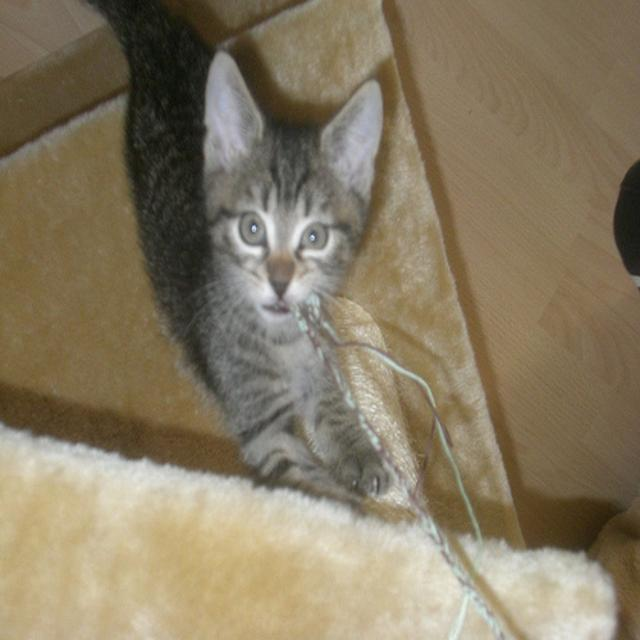
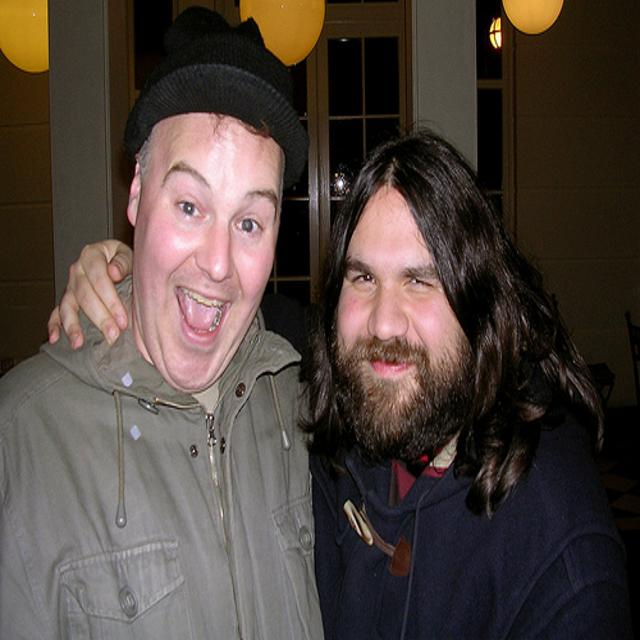
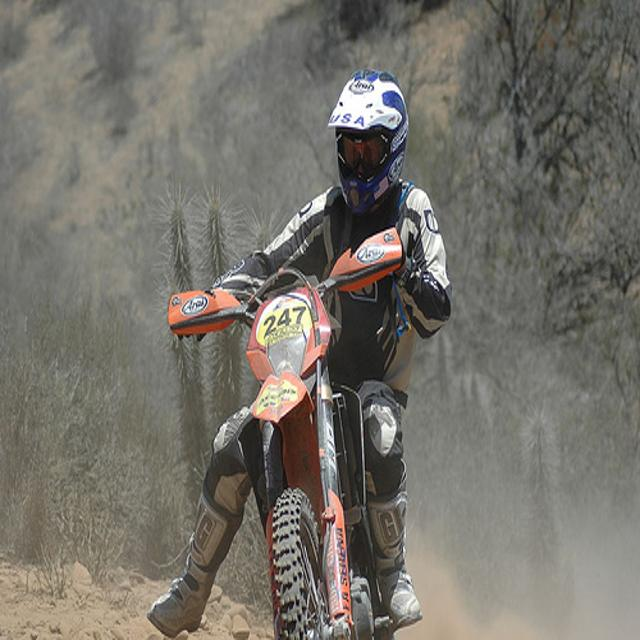
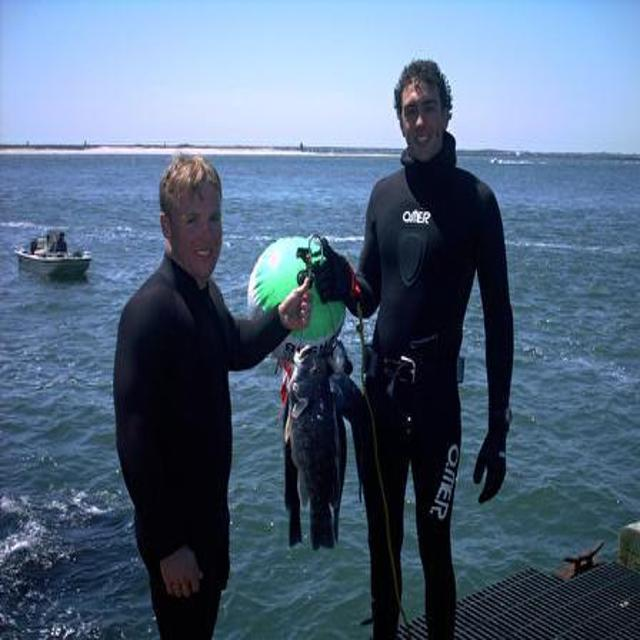
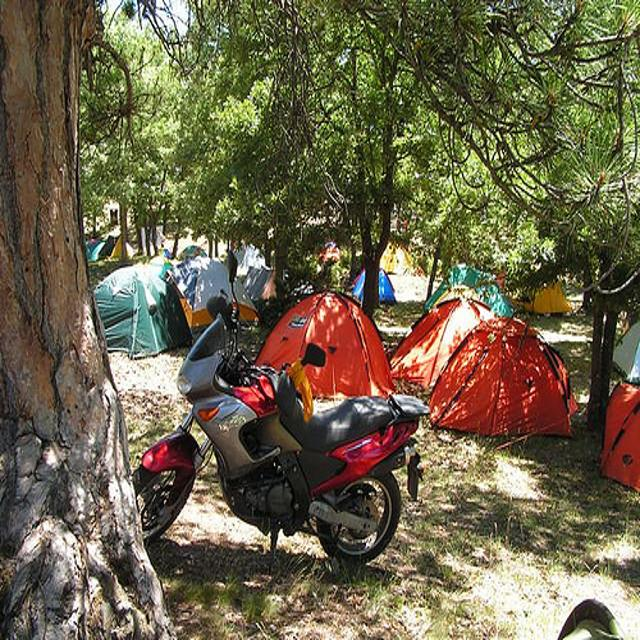


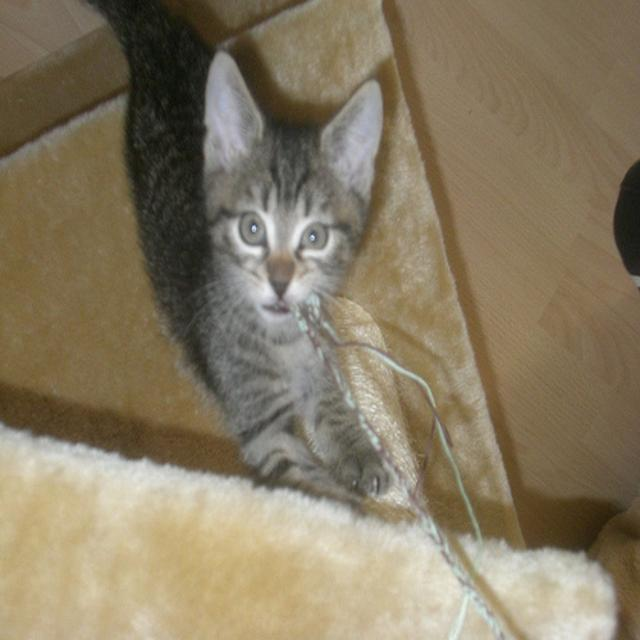
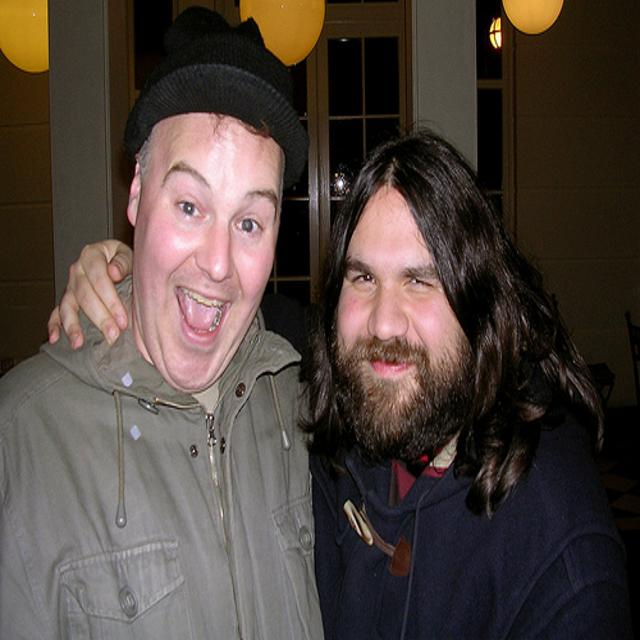
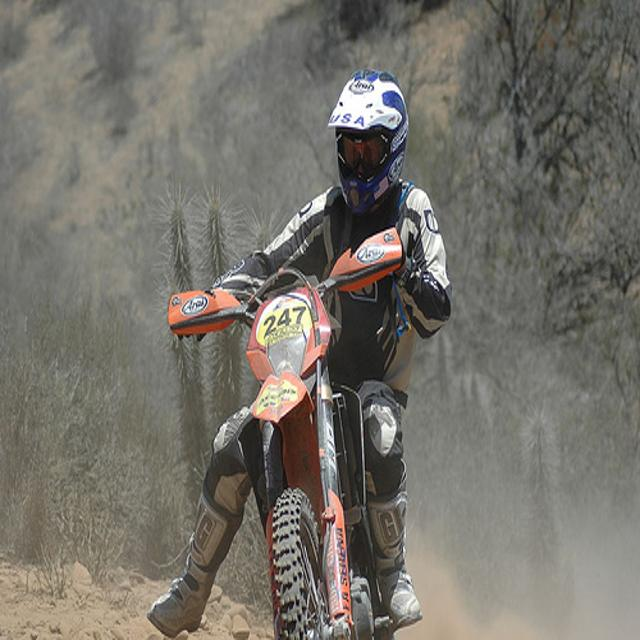
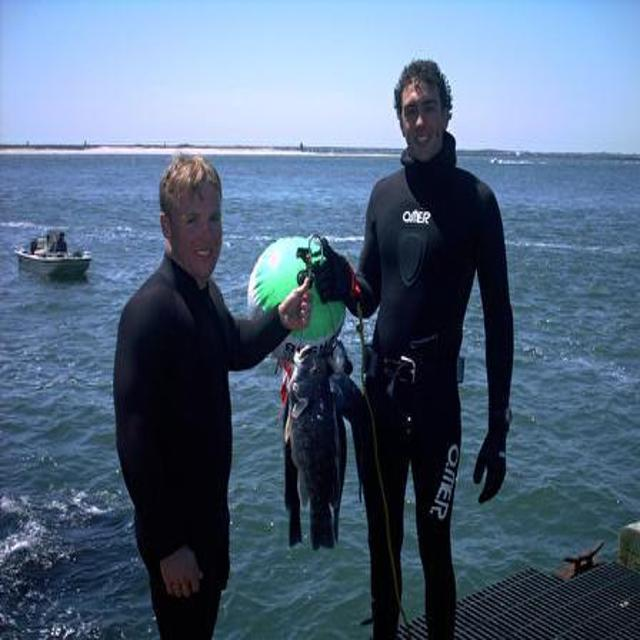
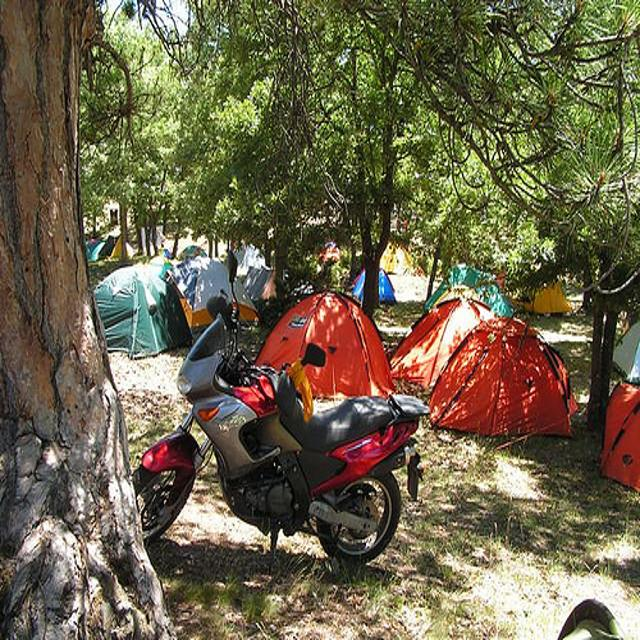


Checking Image Properties:

Image 0: 2009_005219.jpg
- Shape: (640, 640, 3)
- Value Range: [4, 253]
- Data Type: uint8

Bounding Boxes:
- Class 3: center=(0.379, 0.403), size=(0.474, 0.800)
- Coordinates in [0,1]: True

Image 1: 2009_002474.jpg
- Shape: (640, 640, 3)
- Value Range: [0, 255]
- Data Type: uint8

Bounding Boxes:
- Class 2: center=(0.539, 0.602), size=(0.922, 0.796)
- Coordinates in [0,1]: True
- Class 2: center=(0.246, 0.545), size=(0.488, 0.911)
- Coordinates in [0,1]: True

Image 2: 2010_002396.jpg
- Shape: (640, 640, 3)
- Value Range: [0, 255]
- Data Type: uint8

Bounding Boxes:
- Class 2: center=(0.465, 0.550), size=(0.482, 0.901)
- Coordinates in [0,1]: True
- Class 1: center=(0.448, 0.673), size=(0.380, 0.654)
- Coordinates in [0,1]: True

Image 3: 2008_005043.jpg
- Shape: (640, 640, 3)
- Value Range: [0, 255]
- Data Type: uint8

Bounding Boxes:
- Class 2: center=(0.333, 0.621), size=(0.312, 0.759)
- Coordinates in [0,1]: True
- Class 2: center=(0.646, 0.548), size

In [6]:
def check_yolo_dataset(dataset_dir, split='train', num_samples=5):
    """Check and visualize YOLO dataset"""
    
    # Get paths
    images_dir = Path(dataset_dir) / split / 'images'
    labels_dir = Path(dataset_dir) / split / 'labels'
    
    # Get list of image files
    image_files = list(images_dir.glob('*.jpg'))[:num_samples]
    
    # Load images for display
    display_images = []
    for img_path in image_files:
        img = Image.open(img_path)
        display_images.append(np.array(img))
    
    # Display sample images
    print(f"Displaying {num_samples} images from {split} set:")
    ipyplot.plot_images(display_images, max_images=num_samples, img_width=150)
    
    print("\nChecking Image Properties:")
    for i, img_path in enumerate(image_files):
        img = np.array(Image.open(img_path))
        print(f"\nImage {i}: {img_path.name}")
        print(f"- Shape: {img.shape}")
        print(f"- Value Range: [{img.min()}, {img.max()}]")
        print(f"- Data Type: {img.dtype}")
        
        # Check corresponding label file
        label_path = labels_dir / f"{img_path.stem}.txt"
        if label_path.exists():
            print("\nBounding Boxes:")
            with open(label_path, 'r') as f:
                bboxes = [line.strip().split() for line in f.readlines()]
                for bbox in bboxes:
                    class_idx, x_center, y_center, width, height = map(float, bbox)
                    print(f"- Class {int(class_idx)}: center=({x_center:.3f}, {y_center:.3f}), "
                          f"size=({width:.3f}, {height:.3f})")
                    # Verify normalization
                    coords = [x_center, y_center, width, height]
                    print(f"- Coordinates in [0,1]: {all(0 <= x <= 1 for x in coords)}")
        else:
            print(f"Warning: No label file found for {img_path.name}")

# Check both training and validation sets
print("Checking Training Set:")
check_yolo_dataset('yolo_dataset', 'train')

print("\nChecking Validation Set:")
check_yolo_dataset('yolo_dataset', 'val')

In [7]:
model = YOLO('yolov8n.pt')
model.train(
    data=yaml_path, 
    epochs=100, 
    imgsz=640,
    batch=16,
    device=0,
    cache=True,
    amp=True,
    optimizer='SGD',
    lr0=0.01,
    lrf=0.001,
    box=7.5,
    cls=0.8, 
    dfl=1.7,
)

New https://pypi.org/project/ultralytics/8.3.49 available 😃 Update with 'pip install -U ultralytics'
Ultralytics 8.3.48 🚀 Python-3.12.7 torch-2.5.1+cu124 CUDA:0 (NVIDIA GeForce GTX 1650 Ti, 3719MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=/home/yubelgg/personal/ml-voc/VOCdevkit/yolo_dataset.yaml, epochs=100, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=True, device=0, workers=8, project=None, name=train32, exist_ok=False, pretrained=True, optimizer=SGD, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_mask

train: Scanning /home/yubelgg/personal/ml-voc/VOCdevkit/yolo_dataset/train/labels... 949 images, 0 backgrounds, 0 corrupt: 100%|██████████| 949/949 [00:00<00:00, 2570.27it/s]

train: New cache created: /home/yubelgg/personal/ml-voc/VOCdevkit/yolo_dataset/train/labels.cache


WARNING ⚠️ cache='ram' may produce non-deterministic training results. Consider cache='disk' as a deterministic alternative if your disk space allows.


train: Caching images (1.1GB RAM): 100%|██████████| 949/949 [00:00<00:00, 2243.79it/s]
val: Scanning /home/yubelgg/personal/ml-voc/VOCdevkit/yolo_dataset/val/labels... 950 images, 0 backgrounds, 0 corrupt: 100%|██████████| 950/950 [00:00<00:00, 1222.35it/s]

val: New cache created: /home/yubelgg/personal/ml-voc/VOCdevkit/yolo_dataset/val/labels.cache


WARNING ⚠️ cache='ram' may produce non-deterministic training results. Consider cache='disk' as a deterministic alternative if your disk space allows.


val: Caching images (1.1GB RAM): 100%|██████████| 950/950 [00:00<00:00, 2094.23it/s]


Plotting labels to /home/yubelgg/personal/ml-voc/runs/detect/train32/labels.jpg... 
optimizer: SGD(lr=0.01, momentum=0.937) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to /home/yubelgg/personal/ml-voc/runs/detect/train32
Starting training for 100 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/100      3.73G      1.022      4.516      1.489         19        640: 100%|██████████| 60/60 [00:21<00:00,  2.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:09<00:00,  3.27it/s]

                   all        950       2044       0.86      0.161      0.482      0.301



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/100      3.74G      1.046       2.88      1.497         22        640: 100%|██████████| 60/60 [00:21<00:00,  2.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:08<00:00,  3.34it/s]

                   all        950       2044      0.599      0.543      0.573      0.327



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/100      3.72G      1.078       2.71      1.514         23        640: 100%|██████████| 60/60 [00:20<00:00,  2.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:09<00:00,  3.16it/s]

                   all        950       2044      0.421        0.4      0.358      0.167



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/100      3.71G       1.15      2.725       1.58         26        640: 100%|██████████| 60/60 [00:20<00:00,  2.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:09<00:00,  3.18it/s]


                   all        950       2044      0.439      0.419      0.372      0.176

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/100      3.74G      1.131      2.655      1.572         18        640: 100%|██████████| 60/60 [00:21<00:00,  2.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:09<00:00,  3.19it/s]

                   all        950       2044      0.481      0.374      0.346      0.151



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/100      3.77G      1.143      2.547      1.577         22        640: 100%|██████████| 60/60 [00:20<00:00,  2.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:09<00:00,  3.19it/s]

                   all        950       2044      0.506      0.382      0.376      0.163



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/100      3.74G      1.119      2.494      1.565         36        640: 100%|██████████| 60/60 [00:21<00:00,  2.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:08<00:00,  3.47it/s]

                   all        950       2044       0.57      0.393       0.41      0.195



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/100      3.75G      1.093      2.363      1.543         19        640: 100%|██████████| 60/60 [00:21<00:00,  2.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:08<00:00,  3.43it/s]

                   all        950       2044      0.463      0.418      0.393      0.191



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/100      3.75G      1.081      2.282      1.536         20        640: 100%|██████████| 60/60 [00:21<00:00,  2.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:08<00:00,  3.46it/s]

                   all        950       2044      0.465       0.39      0.354      0.176



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/100      3.71G      1.056      2.171      1.513         12        640: 100%|██████████| 60/60 [00:21<00:00,  2.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:09<00:00,  3.29it/s]

                   all        950       2044      0.462      0.418      0.389      0.189



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/100      3.62G      1.029       2.14        1.5         20        640: 100%|██████████| 60/60 [00:21<00:00,  2.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:08<00:00,  3.54it/s]

                   all        950       2044      0.532      0.461      0.436      0.216



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/100      3.75G     0.9824      1.986      1.458         27        640: 100%|██████████| 60/60 [00:21<00:00,  2.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:09<00:00,  3.31it/s]

                   all        950       2044      0.606       0.46      0.484      0.245



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/100      3.74G      1.015      1.964      1.467         18        640: 100%|██████████| 60/60 [00:21<00:00,  2.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:09<00:00,  3.29it/s]

                   all        950       2044      0.681      0.439        0.5      0.258



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/100      3.74G      0.996       1.95       1.47         21        640: 100%|██████████| 60/60 [00:21<00:00,  2.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:08<00:00,  3.54it/s]

                   all        950       2044      0.539      0.451       0.46      0.224



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/100      3.74G      0.962      1.904      1.451         11        640: 100%|██████████| 60/60 [00:21<00:00,  2.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:08<00:00,  3.52it/s]

                   all        950       2044      0.626       0.45      0.482      0.245



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/100      3.72G     0.9296      1.812      1.431         14        640: 100%|██████████| 60/60 [00:21<00:00,  2.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:08<00:00,  3.52it/s]

                   all        950       2044      0.558      0.452      0.434      0.222



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/100      3.73G     0.9326      1.828      1.439         22        640: 100%|██████████| 60/60 [00:21<00:00,  2.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:08<00:00,  3.52it/s]

                   all        950       2044      0.594      0.403      0.456      0.223



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/100      3.73G     0.9302      1.709      1.407         19        640: 100%|██████████| 60/60 [00:21<00:00,  2.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:08<00:00,  3.51it/s]

                   all        950       2044      0.643      0.454      0.492      0.247



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/100      3.73G     0.9326      1.736      1.415         19        640: 100%|██████████| 60/60 [00:21<00:00,  2.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:08<00:00,  3.54it/s]

                   all        950       2044        0.7      0.504      0.578      0.304



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/100      3.73G     0.8939      1.674        1.4         17        640: 100%|██████████| 60/60 [00:21<00:00,  2.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:08<00:00,  3.54it/s]

                   all        950       2044      0.653      0.511      0.561      0.305



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/100      3.76G     0.8925       1.61      1.388         28        640: 100%|██████████| 60/60 [00:21<00:00,  2.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:08<00:00,  3.54it/s]

                   all        950       2044      0.658      0.552      0.599      0.319



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/100      3.76G     0.8825      1.595      1.389         19        640: 100%|██████████| 60/60 [00:21<00:00,  2.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:09<00:00,  3.33it/s]

                   all        950       2044      0.679      0.504      0.563      0.291



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/100      3.71G      0.873      1.557      1.384         40        640: 100%|██████████| 60/60 [00:21<00:00,  2.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:08<00:00,  3.54it/s]

                   all        950       2044      0.661      0.485      0.535      0.281



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/100      3.75G     0.8331      1.514      1.352         16        640: 100%|██████████| 60/60 [00:21<00:00,  2.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:08<00:00,  3.34it/s]

                   all        950       2044       0.64      0.534      0.549      0.288



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/100      3.76G     0.8303      1.493      1.354         25        640: 100%|██████████| 60/60 [00:21<00:00,  2.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:08<00:00,  3.50it/s]

                   all        950       2044      0.627      0.493      0.543      0.291



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/100      3.72G     0.8524      1.506      1.358         22        640: 100%|██████████| 60/60 [00:21<00:00,  2.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:08<00:00,  3.45it/s]

                   all        950       2044       0.67      0.546        0.6      0.327



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/100      3.73G     0.8362       1.46      1.346         25        640: 100%|██████████| 60/60 [00:21<00:00,  2.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:08<00:00,  3.53it/s]

                   all        950       2044      0.672      0.569      0.611      0.332



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/100      3.73G     0.8173       1.44       1.34         27        640: 100%|██████████| 60/60 [00:21<00:00,  2.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:09<00:00,  3.33it/s]

                   all        950       2044      0.677      0.527      0.573      0.314



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/100      3.73G     0.7958      1.397      1.327         34        640: 100%|██████████| 60/60 [00:21<00:00,  2.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:08<00:00,  3.55it/s]

                   all        950       2044      0.714      0.493      0.583      0.326



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/100      3.73G     0.8054      1.362      1.333         17        640: 100%|██████████| 60/60 [00:21<00:00,  2.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:08<00:00,  3.34it/s]

                   all        950       2044      0.688      0.551      0.607      0.329



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/100      3.73G     0.7748      1.339      1.318         24        640: 100%|██████████| 60/60 [00:21<00:00,  2.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:08<00:00,  3.49it/s]

                   all        950       2044      0.705       0.54      0.602       0.32



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/100      3.73G     0.7729      1.303      1.306         23        640: 100%|██████████| 60/60 [00:21<00:00,  2.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:08<00:00,  3.47it/s]

                   all        950       2044      0.752      0.523      0.613      0.338



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/100      3.73G     0.7688      1.324      1.304         20        640: 100%|██████████| 60/60 [00:21<00:00,  2.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:09<00:00,  3.32it/s]

                   all        950       2044       0.66      0.521      0.572      0.313



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/100      3.74G     0.7573      1.293      1.289         23        640: 100%|██████████| 60/60 [00:21<00:00,  2.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:08<00:00,  3.55it/s]

                   all        950       2044      0.694      0.544      0.597      0.325



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/100      3.73G     0.7623      1.299      1.301         21        640: 100%|██████████| 60/60 [00:21<00:00,  2.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:08<00:00,  3.55it/s]

                   all        950       2044       0.67      0.558      0.602      0.328



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/100      3.73G     0.7438      1.286      1.288         19        640: 100%|██████████| 60/60 [00:21<00:00,  2.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:08<00:00,  3.53it/s]

                   all        950       2044      0.627      0.523      0.565       0.31



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/100      3.72G     0.7411      1.241       1.29         31        640: 100%|██████████| 60/60 [00:21<00:00,  2.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:08<00:00,  3.39it/s]

                   all        950       2044      0.731      0.536      0.618      0.356



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/100      3.74G     0.7531      1.258      1.295         43        640: 100%|██████████| 60/60 [00:21<00:00,  2.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:08<00:00,  3.54it/s]

                   all        950       2044       0.71      0.525      0.601      0.336



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/100      3.73G     0.7332      1.201      1.275         14        640: 100%|██████████| 60/60 [00:21<00:00,  2.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:08<00:00,  3.56it/s]

                   all        950       2044      0.684       0.57      0.617      0.343



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/100      3.74G     0.7181      1.195       1.27         14        640: 100%|██████████| 60/60 [00:21<00:00,  2.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:08<00:00,  3.38it/s]

                   all        950       2044      0.723      0.556      0.641      0.366



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/100      3.73G     0.7291      1.217      1.283         19        640: 100%|██████████| 60/60 [00:21<00:00,  2.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:08<00:00,  3.56it/s]

                   all        950       2044       0.73       0.57      0.632      0.358



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/100      3.73G     0.7052      1.187      1.257         30        640: 100%|██████████| 60/60 [00:21<00:00,  2.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:09<00:00,  3.33it/s]

                   all        950       2044      0.729      0.576      0.656      0.376



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/100      3.68G     0.7164      1.214      1.272         17        640: 100%|██████████| 60/60 [00:21<00:00,  2.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:08<00:00,  3.55it/s]

                   all        950       2044      0.742      0.565      0.643      0.363



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/100      3.73G     0.7041      1.159      1.267         14        640: 100%|██████████| 60/60 [00:21<00:00,  2.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:08<00:00,  3.49it/s]

                   all        950       2044      0.743      0.535      0.631      0.358



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/100      3.73G     0.7025      1.161      1.249         49        640: 100%|██████████| 60/60 [00:21<00:00,  2.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:09<00:00,  3.33it/s]

                   all        950       2044      0.742      0.544      0.624      0.355



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/100      3.71G     0.6886      1.128      1.246         29        640: 100%|██████████| 60/60 [00:21<00:00,  2.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:08<00:00,  3.55it/s]

                   all        950       2044      0.729      0.547      0.618      0.351



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/100      3.72G     0.6695      1.099      1.238         25        640: 100%|██████████| 60/60 [00:21<00:00,  2.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:08<00:00,  3.35it/s]

                   all        950       2044      0.744      0.556      0.637      0.363



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/100      3.73G     0.6807      1.089      1.247         24        640: 100%|██████████| 60/60 [00:21<00:00,  2.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:08<00:00,  3.55it/s]

                   all        950       2044      0.688      0.597      0.638      0.358



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/100      3.73G     0.6784      1.089      1.254         12        640: 100%|██████████| 60/60 [00:21<00:00,  2.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:08<00:00,  3.53it/s]

                   all        950       2044      0.725      0.591      0.648      0.375



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/100      3.74G      0.658      1.061      1.225         22        640: 100%|██████████| 60/60 [00:21<00:00,  2.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:08<00:00,  3.53it/s]

                   all        950       2044      0.749       0.58      0.653      0.383



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/100      3.73G     0.6693      1.079      1.232         22        640: 100%|██████████| 60/60 [00:21<00:00,  2.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:08<00:00,  3.55it/s]

                   all        950       2044      0.686       0.59       0.65      0.385



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/100      3.73G     0.6593      1.067      1.233         25        640: 100%|██████████| 60/60 [00:21<00:00,  2.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:08<00:00,  3.34it/s]

                   all        950       2044      0.718      0.567      0.628      0.357



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/100      3.74G     0.6309      1.037       1.22          9        640: 100%|██████████| 60/60 [00:21<00:00,  2.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:08<00:00,  3.38it/s]

                   all        950       2044      0.731      0.543      0.633      0.358



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/100      3.74G     0.6442      1.028      1.229         11        640: 100%|██████████| 60/60 [00:21<00:00,  2.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:08<00:00,  3.51it/s]

                   all        950       2044      0.749      0.556      0.643      0.365



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/100      3.74G     0.6374      1.014      1.213         16        640: 100%|██████████| 60/60 [00:21<00:00,  2.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:09<00:00,  3.33it/s]

                   all        950       2044      0.762      0.558      0.653      0.375



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/100      3.73G     0.6126     0.9801      1.209         20        640: 100%|██████████| 60/60 [00:21<00:00,  2.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:08<00:00,  3.55it/s]

                   all        950       2044      0.743      0.614      0.674      0.392



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/100      3.71G     0.6407     0.9935       1.22         20        640: 100%|██████████| 60/60 [00:21<00:00,  2.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:08<00:00,  3.34it/s]

                   all        950       2044      0.723      0.613       0.67      0.386



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/100      3.73G     0.6165     0.9998       1.21         24        640: 100%|██████████| 60/60 [00:21<00:00,  2.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:09<00:00,  3.33it/s]

                   all        950       2044      0.719      0.618      0.673      0.392



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/100      3.73G     0.6289      1.003      1.205         15        640: 100%|██████████| 60/60 [00:21<00:00,  2.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:08<00:00,  3.56it/s]

                   all        950       2044      0.774      0.567      0.658       0.38



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/100      3.74G     0.6027     0.9417      1.193         24        640: 100%|██████████| 60/60 [00:21<00:00,  2.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:08<00:00,  3.34it/s]

                   all        950       2044      0.685      0.599      0.648      0.365



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/100       3.7G     0.6011     0.9572      1.202         25        640: 100%|██████████| 60/60 [00:21<00:00,  2.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:08<00:00,  3.52it/s]

                   all        950       2044       0.71      0.585       0.65      0.377



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/100      3.73G     0.6043     0.9631      1.203         23        640: 100%|██████████| 60/60 [00:21<00:00,  2.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:08<00:00,  3.53it/s]

                   all        950       2044      0.734      0.583      0.666      0.387



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/100      3.73G     0.5945     0.9463      1.197         19        640: 100%|██████████| 60/60 [00:21<00:00,  2.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:08<00:00,  3.53it/s]

                   all        950       2044      0.755      0.603      0.676      0.396



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/100      3.73G     0.6004     0.9192      1.188         35        640: 100%|██████████| 60/60 [00:21<00:00,  2.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:08<00:00,  3.54it/s]

                   all        950       2044      0.774      0.567      0.668      0.385



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/100      3.73G     0.5714     0.8994      1.185         25        640: 100%|██████████| 60/60 [00:21<00:00,  2.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:08<00:00,  3.55it/s]

                   all        950       2044      0.723      0.618      0.669      0.394



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/100      3.72G     0.5862     0.9221      1.195         21        640: 100%|██████████| 60/60 [00:21<00:00,  2.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:08<00:00,  3.55it/s]

                   all        950       2044      0.714      0.605      0.656      0.383



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/100      3.74G     0.5771     0.9073      1.182         18        640: 100%|██████████| 60/60 [00:21<00:00,  2.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:08<00:00,  3.56it/s]

                   all        950       2044      0.725      0.613      0.672      0.396



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/100      3.73G     0.5589     0.8965      1.165         20        640: 100%|██████████| 60/60 [00:21<00:00,  2.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:09<00:00,  3.33it/s]

                   all        950       2044      0.713      0.622      0.665      0.393



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/100      3.73G     0.5514     0.8812      1.171         20        640: 100%|██████████| 60/60 [00:21<00:00,  2.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:08<00:00,  3.56it/s]

                   all        950       2044      0.758      0.611       0.68      0.394



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/100      3.73G     0.5712       0.89      1.178         31        640: 100%|██████████| 60/60 [00:21<00:00,  2.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:08<00:00,  3.55it/s]

                   all        950       2044      0.738      0.592      0.657      0.386



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/100      3.73G     0.5548     0.8793      1.172         19        640: 100%|██████████| 60/60 [00:21<00:00,  2.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:08<00:00,  3.56it/s]

                   all        950       2044      0.752      0.615      0.692      0.414



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/100      3.73G     0.5532     0.8674      1.163         22        640: 100%|██████████| 60/60 [00:21<00:00,  2.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:08<00:00,  3.56it/s]

                   all        950       2044      0.722      0.604      0.669      0.396



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/100      3.74G     0.5592     0.8701      1.162         19        640: 100%|██████████| 60/60 [00:21<00:00,  2.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:08<00:00,  3.55it/s]

                   all        950       2044      0.763      0.597      0.681      0.405



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/100      3.73G     0.5459     0.8284      1.164         12        640: 100%|██████████| 60/60 [00:21<00:00,  2.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:08<00:00,  3.35it/s]

                   all        950       2044      0.749      0.615      0.686      0.413



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/100      3.74G     0.5276     0.8208      1.161         22        640: 100%|██████████| 60/60 [00:21<00:00,  2.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:08<00:00,  3.53it/s]

                   all        950       2044      0.752       0.62      0.687      0.407



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/100      3.74G     0.5333     0.8158       1.16         34        640: 100%|██████████| 60/60 [00:21<00:00,  2.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:09<00:00,  3.31it/s]

                   all        950       2044      0.753      0.609      0.685      0.409



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/100      3.73G     0.5277     0.8283      1.164         28        640: 100%|██████████| 60/60 [00:21<00:00,  2.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:08<00:00,  3.55it/s]

                   all        950       2044       0.74      0.611      0.677      0.408



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/100      3.71G     0.5308     0.8387      1.159         20        640: 100%|██████████| 60/60 [00:21<00:00,  2.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:08<00:00,  3.55it/s]

                   all        950       2044      0.749      0.615      0.693      0.415



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/100      3.72G     0.5231     0.8066      1.141         12        640: 100%|██████████| 60/60 [00:21<00:00,  2.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:09<00:00,  3.33it/s]

                   all        950       2044      0.738       0.61      0.672      0.411



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/100      3.73G     0.5084     0.8057      1.138         22        640: 100%|██████████| 60/60 [00:21<00:00,  2.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:08<00:00,  3.56it/s]

                   all        950       2044      0.748      0.624      0.687      0.416



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/100      3.74G     0.5262     0.8078      1.164          8        640: 100%|██████████| 60/60 [00:21<00:00,  2.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:08<00:00,  3.55it/s]

                   all        950       2044      0.778      0.601      0.692      0.419



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/100      3.74G     0.5021      0.791      1.131         18        640: 100%|██████████| 60/60 [00:21<00:00,  2.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:08<00:00,  3.39it/s]

                   all        950       2044      0.759      0.617      0.698      0.419



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/100      3.76G     0.5017     0.7733      1.139         18        640: 100%|██████████| 60/60 [00:21<00:00,  2.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:08<00:00,  3.56it/s]

                   all        950       2044      0.751      0.627      0.696      0.421



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/100      3.73G      0.512     0.7876      1.147         19        640: 100%|██████████| 60/60 [00:21<00:00,  2.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:08<00:00,  3.40it/s]

                   all        950       2044      0.733      0.628      0.687      0.415



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/100      3.74G     0.4887     0.7668      1.132         14        640: 100%|██████████| 60/60 [00:21<00:00,  2.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:08<00:00,  3.55it/s]

                   all        950       2044      0.756      0.633      0.699      0.422



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     86/100      3.74G     0.4968     0.7511      1.129         18        640: 100%|██████████| 60/60 [00:21<00:00,  2.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:08<00:00,  3.49it/s]

                   all        950       2044       0.75       0.62      0.697      0.419



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     87/100      3.74G     0.4755     0.7484      1.128         18        640: 100%|██████████| 60/60 [00:21<00:00,  2.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:08<00:00,  3.35it/s]

                   all        950       2044      0.768      0.627      0.699      0.425



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     88/100      3.71G     0.4809     0.7474      1.132         14        640: 100%|██████████| 60/60 [00:21<00:00,  2.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:08<00:00,  3.34it/s]

                   all        950       2044      0.781      0.607      0.692      0.418



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     89/100      3.74G     0.4742     0.7283      1.121         19        640: 100%|██████████| 60/60 [00:21<00:00,  2.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:08<00:00,  3.56it/s]

                   all        950       2044      0.792      0.633      0.703      0.424



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     90/100      3.73G     0.4734      0.732      1.121         37        640: 100%|██████████| 60/60 [00:21<00:00,  2.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:09<00:00,  3.33it/s]

                   all        950       2044      0.782      0.619      0.698      0.427


Closing dataloader mosaic

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     91/100      3.73G     0.9247      1.333       1.51         18        640: 100%|██████████| 60/60 [00:21<00:00,  2.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:08<00:00,  3.41it/s]

                   all        950       2044      0.738      0.642      0.691      0.413



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     92/100      3.73G     0.8623       1.27      1.451          7        640: 100%|██████████| 60/60 [00:20<00:00,  2.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:09<00:00,  3.32it/s]

                   all        950       2044       0.76       0.64      0.711      0.435



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     93/100      3.72G     0.8355      1.185      1.413         14        640: 100%|██████████| 60/60 [00:21<00:00,  2.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:09<00:00,  3.32it/s]

                   all        950       2044      0.775      0.624      0.708      0.439



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     94/100      3.71G     0.8165      1.154      1.396         10        640: 100%|██████████| 60/60 [00:21<00:00,  2.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:08<00:00,  3.53it/s]

                   all        950       2044      0.791      0.638      0.721      0.448



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     95/100      3.76G     0.8124       1.13      1.395          8        640: 100%|██████████| 60/60 [00:21<00:00,  2.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:08<00:00,  3.54it/s]

                   all        950       2044       0.79      0.645      0.728      0.455



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     96/100      3.71G     0.8022      1.115      1.386          9        640: 100%|██████████| 60/60 [00:21<00:00,  2.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:08<00:00,  3.56it/s]

                   all        950       2044      0.759      0.663      0.729      0.455



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     97/100      3.76G     0.7981      1.102      1.374          6        640: 100%|██████████| 60/60 [00:21<00:00,  2.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:08<00:00,  3.56it/s]

                   all        950       2044      0.775      0.663      0.736      0.466



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     98/100      3.73G      0.795       1.08      1.373         11        640: 100%|██████████| 60/60 [00:20<00:00,  2.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:08<00:00,  3.34it/s]

                   all        950       2044      0.779      0.662      0.735      0.465



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     99/100      3.73G     0.7756      1.072      1.353          6        640: 100%|██████████| 60/60 [00:20<00:00,  2.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:09<00:00,  3.33it/s]

                   all        950       2044      0.785      0.652      0.731      0.463



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    100/100      3.73G     0.7615      1.054      1.353          7        640: 100%|██████████| 60/60 [00:20<00:00,  2.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:08<00:00,  3.56it/s]

                   all        950       2044       0.79       0.65      0.735      0.466



100 epochs completed in 0.838 hours.
Optimizer stripped from /home/yubelgg/personal/ml-voc/runs/detect/train32/weights/last.pt, 6.3MB
Optimizer stripped from /home/yubelgg/personal/ml-voc/runs/detect/train32/weights/best.pt, 6.3MB

Validating /home/yubelgg/personal/ml-voc/runs/detect/train32/weights/best.pt...
Ultralytics 8.3.48 🚀 Python-3.12.7 torch-2.5.1+cu124 CUDA:0 (NVIDIA GeForce GTX 1650 Ti, 3719MiB)
Model summary (fused): 168 layers, 3,006,623 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:08<00:00,  3.51it/s]


                   all        950       2044      0.786      0.651      0.735      0.466
               bicycle        200        267      0.827      0.562      0.692      0.469
             motorbike        200        292      0.738      0.658      0.719      0.456
                person        456       1011      0.789      0.634      0.717      0.411
                   cat        201        232       0.78      0.724      0.773      0.444
                 train        200        242      0.799      0.676      0.771      0.553
Speed: 0.3ms preprocess, 5.7ms inference, 0.0ms loss, 0.6ms postprocess per image
Results saved to /home/yubelgg/personal/ml-voc/runs/detect/train32


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1, 2, 3, 4])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x796204707440>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
        